In [114]:
import os
import json
import yaml
import logging
import zarr
import s3fs
import fsspec
import numcodecs
import geojson
import pystac
import pyproj
import rioxarray
import pandas as pd
import geopandas as gpd
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import shapely.geometry
import odc.geo.xr

from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from datetime import datetime
from IPython.display import HTML, display, Image
from copy import deepcopy
from tqdm.auto import tqdm
from odc.stac import stac_load
from odc.stac import configure_rio, stac_load
from shapely.geometry import shape, Polygon, LinearRing
from shapely.ops import transform
from pystac_client import Client
from pystac.extensions.projection import ProjectionExtension
from geojson.utils import coords
from pyproj import CRS, Transformer
from numcodecs import Blosc
from zarr.codecs.blosc import BloscCodec
from s3fs import S3Map

In [2]:
def bounds_to_ring(geom):
    minx, miny, maxx, maxy = geom.bounds
    return LinearRing([
        (minx, miny),
        (maxx, miny),
        (maxx, maxy),
        (minx, maxy),
        (minx, miny)
    ])

## Carregando dados

In [3]:
gdf_municipios = gpd.read_file('data/municipio/BR_Municipios_2020.shp')

In [4]:
gdf_municipios.head(5)

,CD_MUN,NM_MUN,SIGLA_UF,AREA_KM2,geometry
0,1100015,Alta Floresta D'Oeste,RO,7067.127,"POLYGON ((-62.19465 -11.82746, -62.19332 -11.8..."
1,1100023,Ariquemes,RO,4426.571,"POLYGON ((-62.53648 -9.73222, -62.52765 -9.736..."
2,1100031,Cabixi,RO,1314.352,"POLYGON ((-60.37119 -13.36655, -60.37134 -13.3..."
3,1100049,Cacoal,RO,3793.000,"POLYGON ((-61.0008 -11.29737, -61.00103 -11.39..."
4,1100056,Cerejeiras,RO,2783.300,"POLYGON ((-61.49976 -13.00525, -61.49809 -13.0..."


In [5]:
crs = "EPSG:4674"
gdf_municipios = gdf_municipios.to_crs(crs)

In [6]:
gdf_mg = gdf_municipios[gdf_municipios['SIGLA_UF'] == 'MG']

In [7]:
gdf_mg['boundary'] = gdf_mg.boundary
gdf_mg["centroid"] = gdf_mg.centroid
gdf_mg["bounds"] = gdf_mg.geometry.apply(bounds_to_ring)

/home/sagemaker-user/.conda/envs/venv_geo/lib/python3.11/site-packages/geopandas/geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/tmp/ipykernel_2529/553351102.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_mg["centroid"] = gdf_mg.centroid
/home/sagemaker-user/.conda/envs/venv_geo/lib/python3.11/site-packages/geopandas/geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org

In [8]:
# gdf_mg["bounds_buffer"] = gdf_mg["bounds_buffer"].buffer(0.05)

In [10]:
gdf = gdf_mg[gdf_mg['NM_MUN'] == 'Conselheiro Lafaiete'].reset_index()

In [11]:
gdf.head(5)

,index,CD_MUN,NM_MUN,SIGLA_UF,AREA_KM2,geometry,boundary,centroid,bounds
0,2445,3118304,Conselheiro Lafaiete,MG,370.246,"POLYGON ((-43.79878 -20.53897, -43.79853 -20.5...","LINESTRING (-43.79878 -20.53897, -43.79853 -20...",POINT (-43.78866 -20.66601),"LINEARRING (-43.93001 -20.80102, -43.67878 -20..."


In [13]:
geom = json.loads(gdf['geometry'].to_json())['features'][0]['geometry']
# geom

In [14]:
def load_geosjon(path: str) -> dict:
    with open(path, "r") as f:
        obj = geojson.load(f)
    return obj


def get_polygon_from_geometry(geometry: dict) -> Polygon:
    return Polygon(coords(geometry['coordinates']))

In [15]:
polygon = get_polygon_from_geometry(geom)

transformer = Transformer.from_crs("urn:ogc:def:crs:OGC:1.3:CRS84", "EPSG:4326", always_xy=True)
polygon = transform(transformer.transform, polygon)

In [ ]:
# polygon = gdf.geometry[0]

In [16]:
min_lon, min_lat, max_lon, max_lat = polygon.bounds
print(f"Latitude:  {min_lat} : {max_lat}")
print(f"Longitude: {min_lon} : {max_lon}")

Latitude:  -20.801021996 : -20.538032996
Longitude: -43.930008 : -43.67878


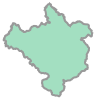

In [17]:
polygon

## Buscando imagens

In [18]:
CATALOG = "https://earth-search.aws.element84.com/v1/"
client = Client.open(CATALOG)

In [23]:
start_date = datetime(2025, 3, 1).strftime("%Y-%m-%d")
end_date = datetime(2025, 3, 30).strftime("%Y-%m-%d")

search = client.search(
    collections=["sentinel-2-l2a"],
    datetime=f"{start_date}/{end_date}",
    bbox=polygon.bounds,
    max_items=10,
    sortby=[{"field": "properties.datetime", "direction": "desc"}],
)

items = list(search.items())
print(f"Found: {len(items):d} datasets")

Found: 10 datasets


In [24]:
collections = search.item_collection()
collections

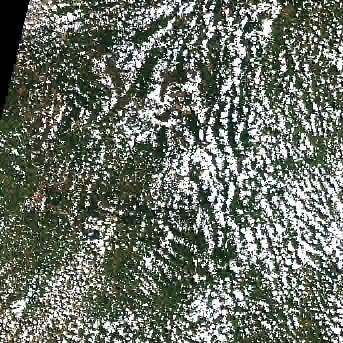

In [25]:
Image(collections[1].assets['thumbnail'].href)

In [26]:
# https://odc-stac.readthedocs.io/en/latest/_api/odc.stac.load.html
crs = "epsg:3395" # EPSG:32723 | 4326 | 3857 | 3395 | 4674 | ESRI:54009

dataset = stac_load(
    items,
    bands=("red", "green", "blue", "nir", "nir08", "rededge1", "rededge2", "rededge3", "swir16", "swir22", "scl"),
    crs=crs,
    resolution=10,
    # chunks={"x": 2048, "y": 2048},  # <-- use Dask
    groupby="solar_day",
    bbox=polygon.bounds,
    # dtype="float32",
    # nodata=0,
    # query={"eo:cloud_cover": {"lt": 20}},
    progress=tqdm,
    pool=4,
)

  0%|          | 0/220 [00:00<?, ?it/s]

<xarray.Dataset> Size: 914MB
Dimensions:      (y: 3112, x: 2798, time: 5)
Coordinates:
  * y            (y) float64 25kB -2.322e+06 -2.322e+06 ... -2.353e+06
  * x            (x) float64 22kB -4.89e+06 -4.89e+06 ... -4.862e+06 -4.862e+06
    spatial_ref  int32 4B 3395
  * time         (time) datetime64[ns] 40B 2025-03-18T13:08:16.688000 ... 202...
Data variables:
    red          (time, y, x) uint16 87MB 4888 5112 5288 5368 ... 81 62 68 145
    green        (time, y, x) uint16 87MB 4848 5068 5284 5416 ... 131 138 186
    blue         (time, y, x) uint16 87MB 4952 5168 5296 5436 ... 113 105 96 171
    nir          (time, y, x) uint16 87MB 5552 5748 5880 5992 ... 564 625 542
    nir08        (time, y, x) uint16 87MB 5846 5846 6066 6066 ... 625 625 630
    rededge1     (time, y, x) uint16 87MB 5403 5403 5757 5757 ... 210 210 233
    rededge2     (time, y, x) uint16 87MB 5670 5670 5977 5977 ... 489 489 491
    rededge3     (time, y, x) uint16 87MB 5663 5663 5961 5961 ... 605 605 569
    swir16       (time, y, x) uint16 87MB 5395 5395 5596 5596 ... 344 344 374
    swir22       (time, y, x) uint16 87MB 4814 4814 5038 5038 ... 170 170 169
    scl          (time, y, x) uint8 44MB 9 9 9 9 9 9 9 9 9 ... 3 3 3 3 3 3 3 3 3

In [ ]:
# https://docs.xarray.dev/en/latest/api/dataset.html
display(dataset)

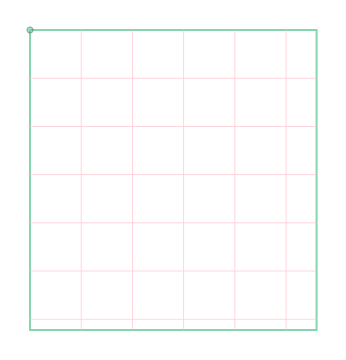

In [27]:
dataset.odc.geobox

In [28]:
type(dataset)

xarray.core.dataset.Dataset

In [32]:
dataset['blue'].max()

<xarray.DataArray 'blue' ()> Size: 2B
array(18008, dtype=uint16)
Coordinates:
    spatial_ref  int32 4B 3395

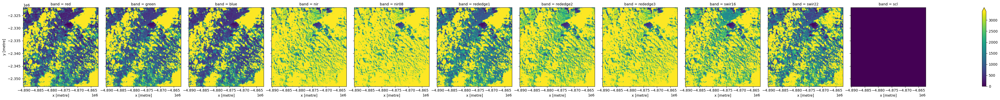

In [33]:
_ = (
    dataset.isel(time=2)
    .to_array("band")
    .plot.imshow(
        col="band",
        size=4,
        vmin=0,
        vmax=3400,
    )
)

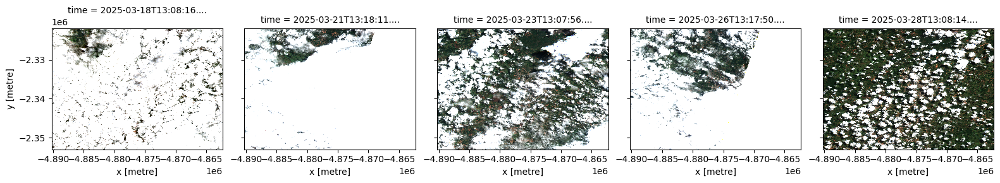

In [174]:
vis = dataset.odc.to_rgba(bands=("red", "green", "blue"), vmin=0, vmax=3400)
vis.plot.imshow(col='time', rgb='band', col_wrap=5, robust=True)

In [ ]:
ndvi = (dataset.nir - dataset.red) / (dataset.nir + dataset.red)
ndwi = (dataset.green - dataset.nir) / (dataset.green + dataset.nir)

## Scene Classification Layer

In [35]:
ds = dataset.isel(time=0)

In [36]:
# Normaliza para 0-1
rgb_image = np.stack([ds.red.values, ds.green.values, ds.blue.values], axis=-1)
rgb_image = exposure.rescale_intensity(rgb_image, in_range='image', out_range=(0, 1))

In [37]:
scl = ds['scl'].values.astype(int)

In [38]:
classes = {
    3: {'name': 'Cloud shadows',         'color': 'blue'},
    4: {'name': 'Vegetation',            'color': 'green'},
    6: {'name': 'Water',                 'color': 'cyan'},
    7: {'name': 'Clouds low prob',       'color': 'orange'},
    8: {'name': 'Clouds medium prob',    'color': 'red'},
    9: {'name': 'Clouds high prob',      'color': 'magenta'},
    10: {'name': 'Thin cirrus',          'color': 'purple'},
    11: {'name': 'Snow / ice',           'color': 'white'}
}

scl_colors = {
    3: (0, 0, 1),      # Cloud shadows -> blue
    4: (0, 1, 0),      # Vegetation    -> green
    6: (0, 1, 1),      # Water         -> cyan
    7: (1, 0.5, 0),    # Clouds low    -> orange
    8: (1, 0, 0),      # Clouds medium -> red
    9: (1, 0, 1),      # Clouds high   -> magenta
    10:(0.6, 0, 0.6),  # Thin cirrus   -> purple
    11:(1, 1, 1),      # Snow/ice      -> white
}

class_names = {
    3: "Cloud shadow",
    4: "Vegetation",
    6: "Water",
    7: "Cloud low",
    8: "Cloud medium",
    9: "Cloud high",
    10: "Thin cirrus",
    11: "Snow"
}

In [40]:
# Cria um array colorido da mesma forma (H, W, 3)
overlay = np.zeros_like(rgb_image)

for scl_val, color in scl_colors.items():
    mask = (scl == scl_val)
    for c in range(3):
        overlay[:, :, c][mask] = color[c]

In [41]:
legend_elements = []

for val, color in scl_colors.items():
    name = class_names.get(val, f"Class {val}")
    patch = Patch(facecolor=color, edgecolor='k', label=name)
    legend_elements.append(patch)

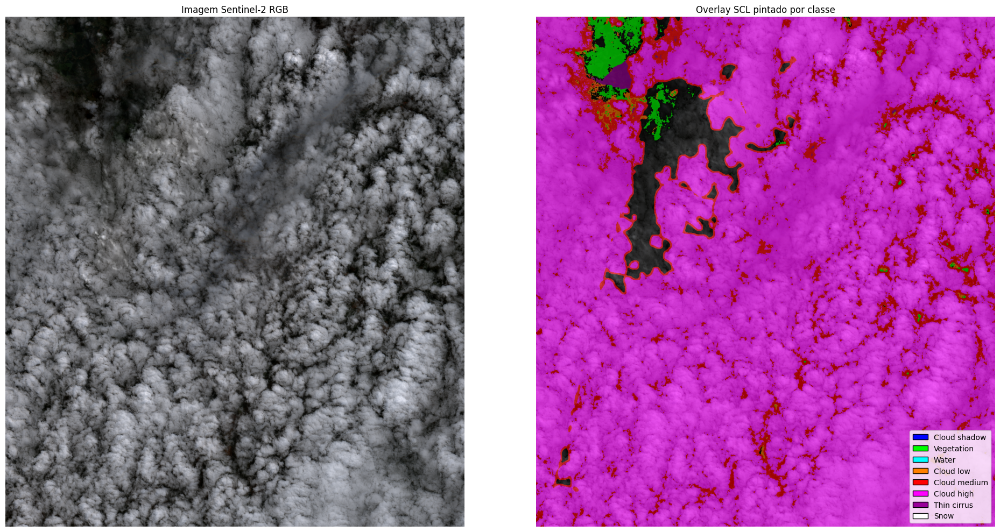

In [42]:
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Imagem original
axes[0].imshow(rgb_image)
axes[0].set_title("Imagem Sentinel-2 RGB")
axes[0].axis('off')

# Imagem com overlay
axes[1].imshow(rgb_image)
axes[1].imshow(overlay, alpha=0.6)
axes[1].set_title("Overlay SCL pintado por classe")
axes[1].axis('off')

# Legenda
axes[1].legend(handles=legend_elements, loc='lower right', fontsize=10, frameon=True)

plt.tight_layout()
plt.show()

# Armazenamento no S3

## Write

In [43]:
dataset

<xarray.Dataset> Size: 914MB
Dimensions:      (y: 3112, x: 2798, time: 5)
Coordinates:
  * y            (y) float64 25kB -2.322e+06 -2.322e+06 ... -2.353e+06
  * x            (x) float64 22kB -4.89e+06 -4.89e+06 ... -4.862e+06 -4.862e+06
    spatial_ref  int32 4B 3395
  * time         (time) datetime64[ns] 40B 2025-03-18T13:08:16.688000 ... 202...
Data variables:
    red          (time, y, x) uint16 87MB 4888 5112 5288 5368 ... 81 62 68 145
    green        (time, y, x) uint16 87MB 4848 5068 5284 5416 ... 131 138 186
    blue         (time, y, x) uint16 87MB 4952 5168 5296 5436 ... 113 105 96 171
    nir          (time, y, x) uint16 87MB 5552 5748 5880 5992 ... 564 625 542
    nir08        (time, y, x) uint16 87MB 5846 5846 6066 6066 ... 625 625 630
    rededge1     (time, y, x) uint16 87MB 5403 5403 5757 5757 ... 210 210 233
    rededge2     (time, y, x) uint16 87MB 5670 5670 5977 5977 ... 489 489 491
    rededge3     (time, y, x) uint16 87MB 5663 5663 5961 5961 ... 605 605 569
    swir16       (time, y, x) uint16 87MB 5395 5395 5596 5596 ... 344 344 374
    swir22       (time, y, x) uint16 87MB 4814 4814 5038 5038 ... 170 170 169
    scl          (time, y, x) uint8 44MB 9 9 9 9 9 9 9 9 9 ... 3 3 3 3 3 3 3 3 3

In [64]:
dataset.time.size

5

In [158]:
print(dataset.dims)

ds_y = dataset.dims.get("y")
ds_x = dataset.dims.get("x")
ds_time = dataset.dims.get("time")
ds_shape = (ds_y, ds_x, ds_time)

FrozenMappingWarningOnValuesAccess({'y': 3112, 'x': 2798, 'time': 5})


In [159]:
# # https://s3fs.readthedocs.io/en/latest/api.html#s3fs.core.S3FileSystem
fs = s3fs.S3FileSystem(anon=False)

S3_PREFIX = "s3://data-us-east-1-891377318910/geospatial/starage"

In [160]:
# 2. Define the Blosc compressor with LZ4, level 5, and byte shuffle
# compressor = Blosc(cname='lz4', clevel=5, shuffle=Blosc.SHUFFLE)
compressor = BloscCodec(cname="lz4", clevel=5, shuffle="shuffle")

In [187]:
# 3. Build the encoding dict for all data variables,
#    specifying compressor and chunk shapes (time=1, y=1024, x=1024)
encoding = {
    var: {
        # "shape": ds_shape,
        "compressor": compressor,
        "shards": (1, 4096, 4096),
        "chunks": (1, 2048, 2048),  # (time, y, x),
    }
    for var in dataset.data_vars
}

In [188]:
prefix_name = "zarr"

# 4. Write to a consolidated Zarr store on S3 with optimal settings
dataset.to_zarr(
    store=f"{S3_PREFIX}/{prefix_name}/lafaiete.zarr",
    mode="w",
    consolidated=True,  # consolidates metadata into a single .zmetadata
    encoding=encoding,
    storage_options={"anon": False},
    # storage_options={"s3": fs},
    write_empty_chunks=False,
    # align_chunks=True,
)

In [163]:
if not fs.exists(f"{S3_PREFIX}/zarr_2/lafaiete.zarr"):
    print("Nao existe")
    mode = "w"
    append_kwargs = {}
else:
    print("Existe")
    mode = "a"
    append_kwargs = {"append_dim": "time"}

Nao existe


## Read

### open_zarr

In [178]:
storage_options = {"s3": fs}

mapper = fs.get_mapper(f"{S3_PREFIX}/{prefix_name}/lafaiete.zarr")
store = S3Map(f"{S3_PREFIX}/{prefix_name}/lafaiete.zarr", s3=fs)

In [179]:
# zarr.consolidate_metadata(f"{S3_PREFIX}/zarr/lafaiete.zarr")

In [180]:
ds = xr.open_zarr(
    store=store,
    consolidated=True,       # usa o .zmetadata consolidado
    chunks={"time": 1},      # opcional: força chunking no tempo para streaming diário
)

In [181]:
ds

<xarray.Dataset> Size: 914MB
Dimensions:      (time: 5, y: 3112, x: 2798)
Coordinates:
  * time         (time) datetime64[ns] 40B 2025-03-18T13:08:16.688000 ... 202...
  * x            (x) float64 22kB -4.89e+06 -4.89e+06 ... -4.862e+06 -4.862e+06
  * y            (y) float64 25kB -2.322e+06 -2.322e+06 ... -2.353e+06
Data variables:
    green        (time, y, x) uint16 87MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    nir          (time, y, x) uint16 87MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    nir08        (time, y, x) uint16 87MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    red          (time, y, x) uint16 87MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    blue         (time, y, x) uint16 87MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    swir16       (time, y, x) uint16 87MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    swir22       (time, y, x) uint16 87MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    rededge1     (time, y, x) uint16 87MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    spatial_ref  int32 4B ...
    scl          (time, y, x) uint8 44MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    rededge2     (time, y, x) uint16 87MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    rededge3     (time, y, x) uint16 87MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>

In [168]:
ds.time.values

array(['2025-03-18T13:08:16.688000000', '2025-03-21T13:18:11.287000000',
       '2025-03-23T13:07:56.057000000', '2025-03-26T13:17:50.496000000',
       '2025-03-28T13:08:14.752000000'], dtype='datetime64[ns]')

In [170]:
# ds['time']

In [171]:
ds.sel(time=slice('2025-03-18', '2025-03-23'))

<xarray.Dataset> Size: 549MB
Dimensions:      (time: 3, y: 3112, x: 2798)
Coordinates:
  * time         (time) datetime64[ns] 24B 2025-03-18T13:08:16.688000 ... 202...
  * x            (x) float64 22kB -4.89e+06 -4.89e+06 ... -4.862e+06 -4.862e+06
  * y            (y) float64 25kB -2.322e+06 -2.322e+06 ... -2.353e+06
Data variables:
    nir          (time, y, x) uint16 52MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    blue         (time, y, x) uint16 52MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    nir08        (time, y, x) uint16 52MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    green        (time, y, x) uint16 52MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    rededge1     (time, y, x) uint16 52MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    rededge3     (time, y, x) uint16 52MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    red          (time, y, x) uint16 52MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    rededge2     (time, y, x) uint16 52MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    scl          (time, y, x) uint8 26MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    swir16       (time, y, x) uint16 52MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    swir22       (time, y, x) uint16 52MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    spatial_ref  int32 4B ...

### open_mfdataset

In [199]:
storage_options = {"s3": fs}

paths = fs.glob(f"{S3_PREFIX}/{prefix_name}/*.zarr")
mappers = [fs.get_mapper(path) for path in paths]
paths

['data-us-east-1-891377318910/geospatial/starage/zarr/lafaiete.zarr']

In [205]:
ds = xr.open_mfdataset(
    f"{S3_PREFIX}/{prefix_name}/*.zarr",
    engine="zarr",
    combine="nested",
    concat_dim="time",
    parallel=True,
    consolidated=True,
    chunks={"time": 1},
)

In [206]:
ds

<xarray.Dataset> Size: 914MB
Dimensions:      (time: 5, y: 3112, x: 2798)
Coordinates:
  * time         (time) datetime64[ns] 40B 2025-03-18T13:08:16.688000 ... 202...
  * x            (x) float64 22kB -4.89e+06 -4.89e+06 ... -4.862e+06 -4.862e+06
  * y            (y) float64 25kB -2.322e+06 -2.322e+06 ... -2.353e+06
Data variables:
    green        (time, y, x) uint16 87MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    blue         (time, y, x) uint16 87MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    nir          (time, y, x) uint16 87MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    red          (time, y, x) uint16 87MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    nir08        (time, y, x) uint16 87MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    swir16       (time, y, x) uint16 87MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    swir22       (time, y, x) uint16 87MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    scl          (time, y, x) uint8 44MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    rededge3     (time, y, x) uint16 87MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    rededge2     (time, y, x) uint16 87MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    spatial_ref  (time) int32 20B 3395 3395 3395 3395 3395
    rededge1     (time, y, x) uint16 87MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>

### Testando

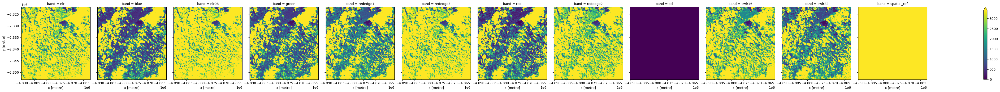

In [172]:
_ = (
    ds.isel(time=2)
    .to_array("band")
    .plot.imshow(
        col="band",
        size=4,
        vmin=0,
        vmax=3400,
    )
)

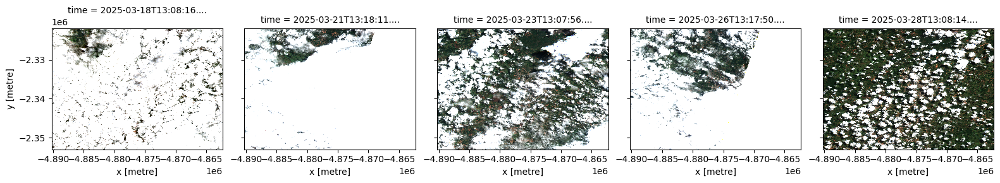

In [175]:
vis = ds.odc.to_rgba(bands=("red", "green", "blue"), vmin=0, vmax=3400)
vis.plot.imshow(col='time', rgb='band', col_wrap=5, robust=True)